In [78]:
2+2

4

In [183]:
import cv2
from IPython.display import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [242]:
imagePath = "37073.jpg"
img = cv2.imread(imagePath)


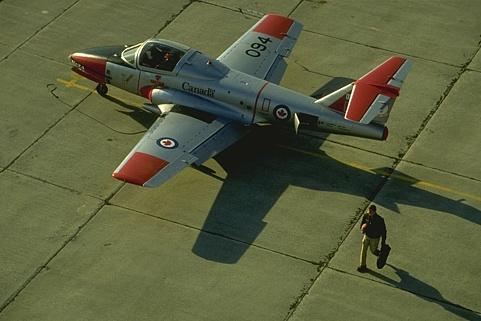

In [243]:
Image(filename = imagePath)

In [244]:
b,g,r = cv2.split(img)
rgbimg = cv2.merge((r,g,b))
print(b)

[[ 0  0 19 ..., 66 67 63]
 [13 35 57 ..., 63 64 61]
 [44 62 76 ..., 62 62 58]
 ..., 
 [44 51 55 ..., 26 26 26]
 [59 56 54 ..., 36 39 32]
 [54 54 54 ..., 32 28 35]]


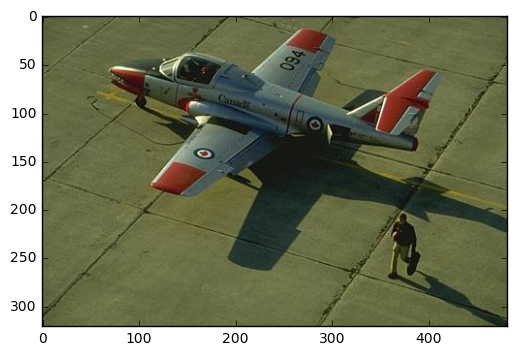

In [245]:
plt.imshow(rgbimg)

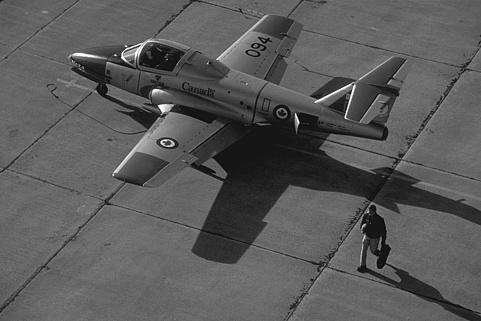

In [84]:
img = cv2.imread(imagePath,0)
cv2.imwrite('test.jpg', img)
Image(filename = 'test.jpg')

In [85]:
image1 = cv2.imread('37073.jpg')

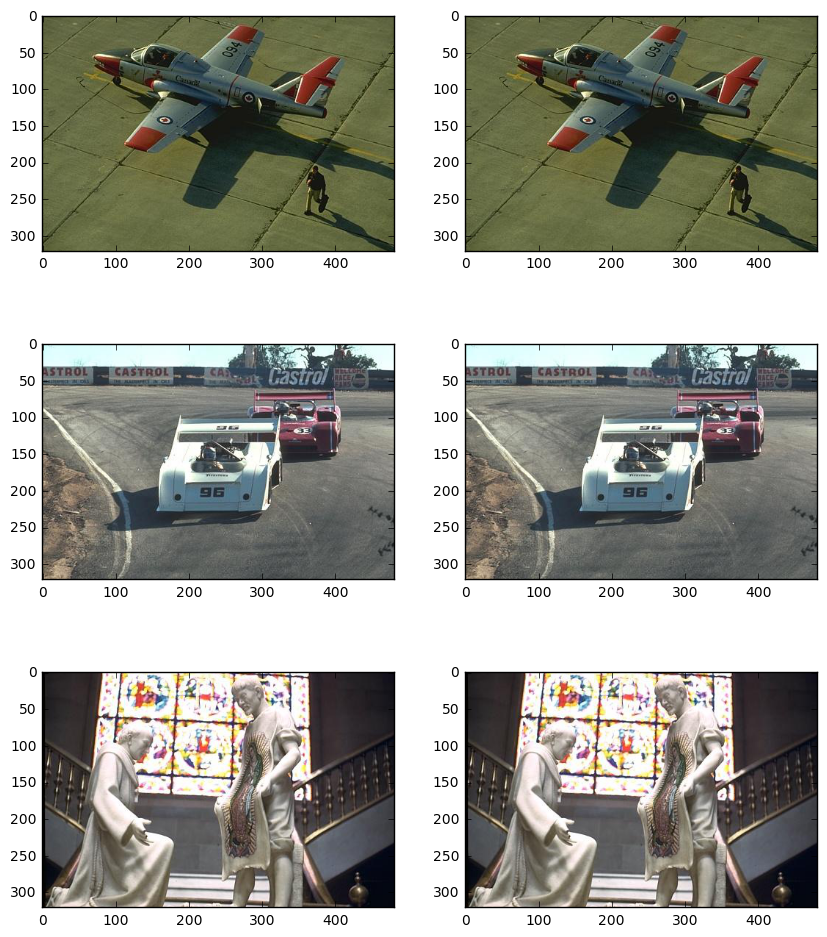

In [250]:
fig, plots = plt.subplots(3, 2,figsize=(10,12))
plots= plots.flatten()

images = ['37073.jpg', '21077.jpg', '24077.jpg']
for ind, image in enumerate(images):
    img = cv2.imread(image)
    b,g,r = cv2.split(img)
    rgbimg = cv2.merge((r,g,b))
    plots[2*ind].imshow(rgbimg)
    im1= cv2.blur(img,(1,1))
    b,g,r = cv2.split(im1)
    rgbimg = cv2.merge((r,g,b))
    plots[2*ind + 1].imshow(rgbimg)


    

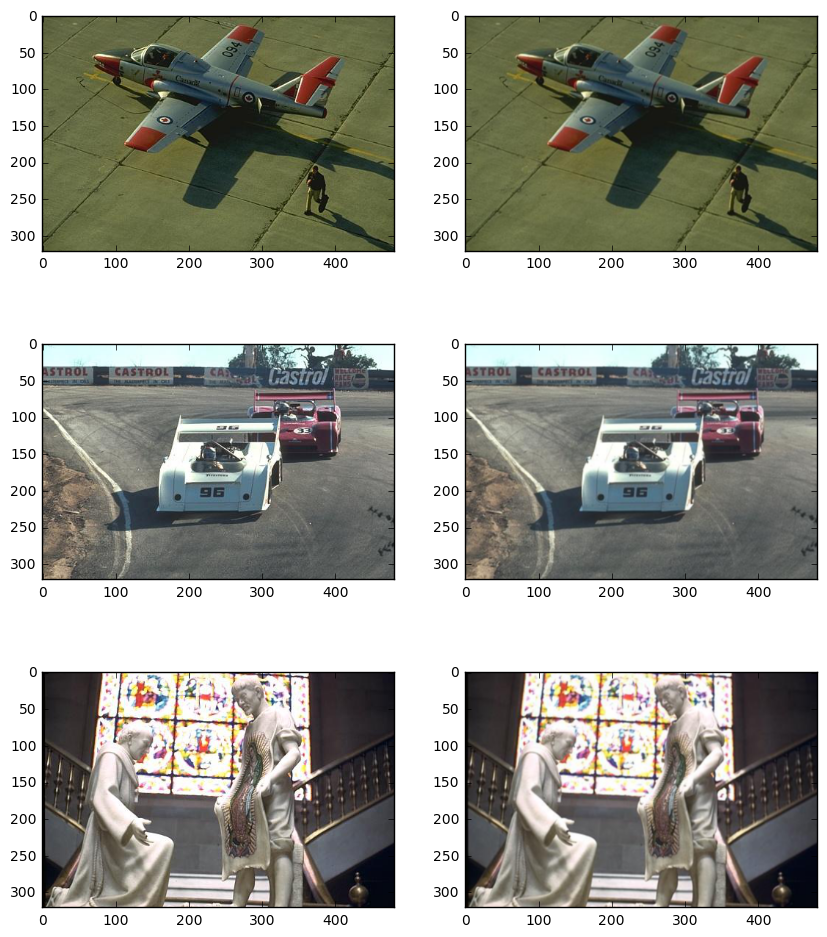

In [254]:
fig, plots = plt.subplots(3, 2,figsize=(10,12))
plots= plots.flatten()

images = ['37073.jpg', '21077.jpg', '24077.jpg']
for ind, image in enumerate(images):
    img = cv2.imread(image)
    b,g,r = cv2.split(img)
    rgbimg = cv2.merge((r,g,b))
    plots[2*ind].imshow(rgbimg)
    im1= cv2.GaussianBlur(img,(3,3),0)
    b,g,r = cv2.split(im1)
    rgbimg = cv2.merge((r,g,b))
    plots[2*ind + 1].imshow(rgbimg)




In [86]:
image2 = cv2.imread('21077.jpg')

In [87]:
image3 = cv2.imread('24077.jpg')

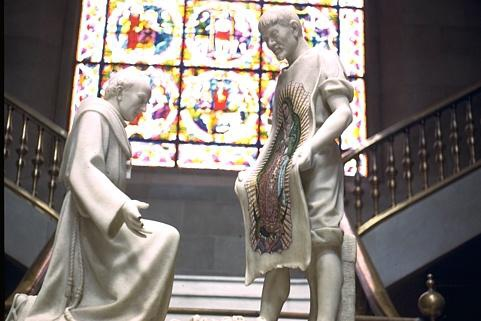

In [88]:
im1 = cv2.blur(image3,(1,1))
cv2.imwrite('temp.jpg', im1)
Image(filename = 'temp.jpg')


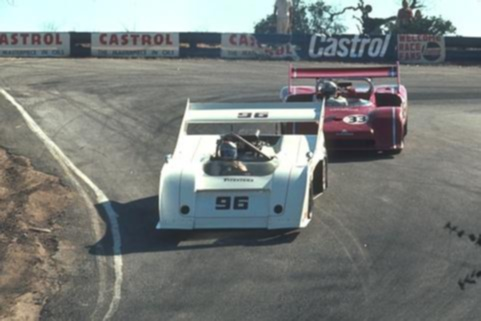

In [89]:
im1 = cv2.GaussianBlur(image2,(3,3),0)
cv2.imwrite('temp.jpg', im1)
Image(filename = 'temp.jpg')



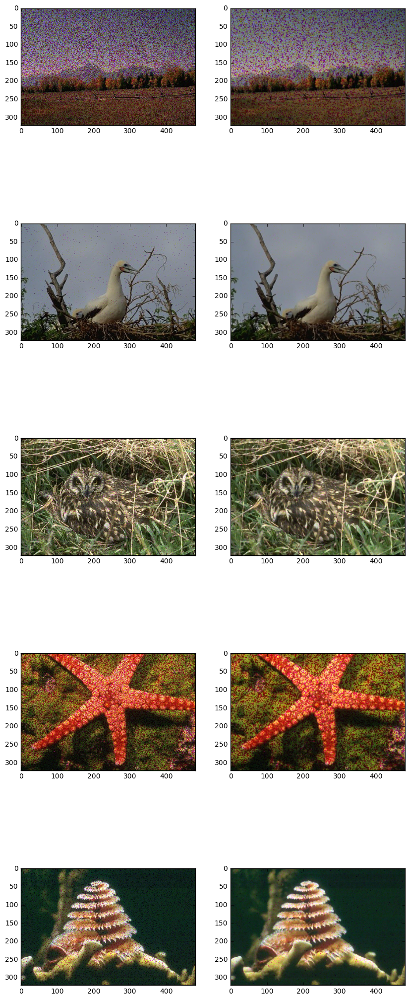

In [241]:
fig, plots = plt.subplots(5, 2,figsize=(10,27))
plots= plots.flatten()
images = ['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg' ]
for ind,image in enumerate(images):
    im1 = cv2.imread('snp/' + image)
    b,g,r = cv2.split(im1)
    rgbimg = cv2.merge((r,g,b))
    plots[2*ind].imshow(rgbimg)
    medianImage = cv2.medianBlur(im1,3)
    b,g,r = cv2.split(medianImage)
    rgbimg = cv2.merge((r,g,b))
    plots[2*ind+1].imshow(rgbimg)
    rgbimg = cv2.merge((r,g,b))


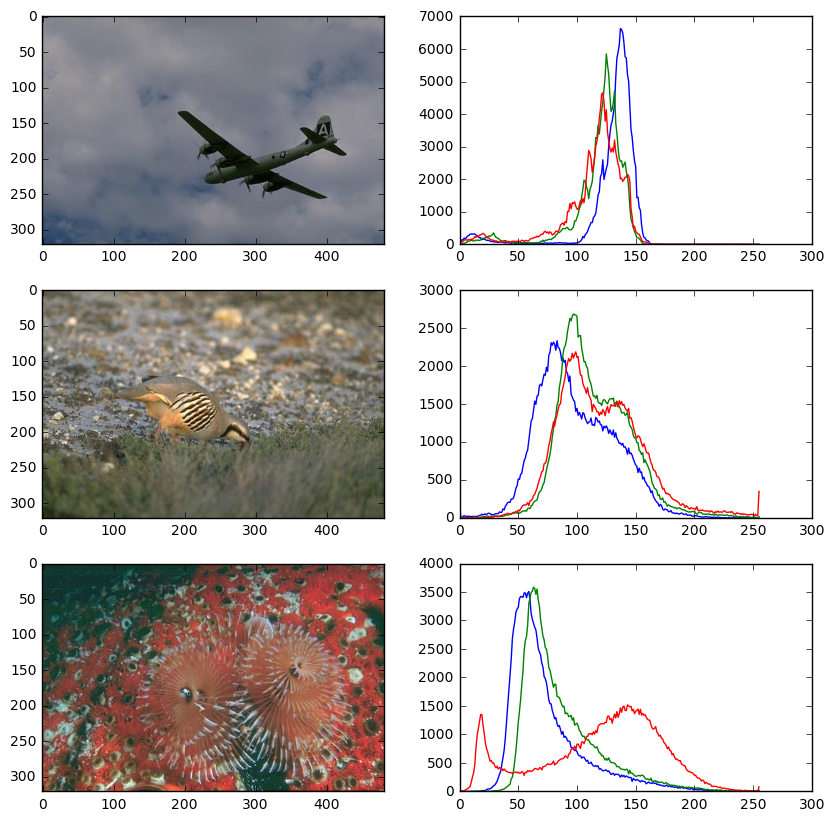

In [225]:
def plothistogram(img,plt):
    color = ('b','g','r')
    for i,col in enumerate(color):
        histr = cv2.calcHist([img],[i],None,[256],[0,256])
        plt.plot(histr,color = col)

fig, plots = plt.subplots(3, 2,figsize=(10,10))
plots= plots.flatten()


images = ['3096.jpg', '8023.jpg', '12084.jpg']

for ind,image in enumerate(images):
    b,g,r = cv2.split(cv2.imread('img/' + image))
    rgbimg = cv2.merge((r,g,b))
    plots[2*ind].imshow(rgbimg)
    plothistogram(cv2.imread('img/' + image), plots[ind * 2 + 1])
    



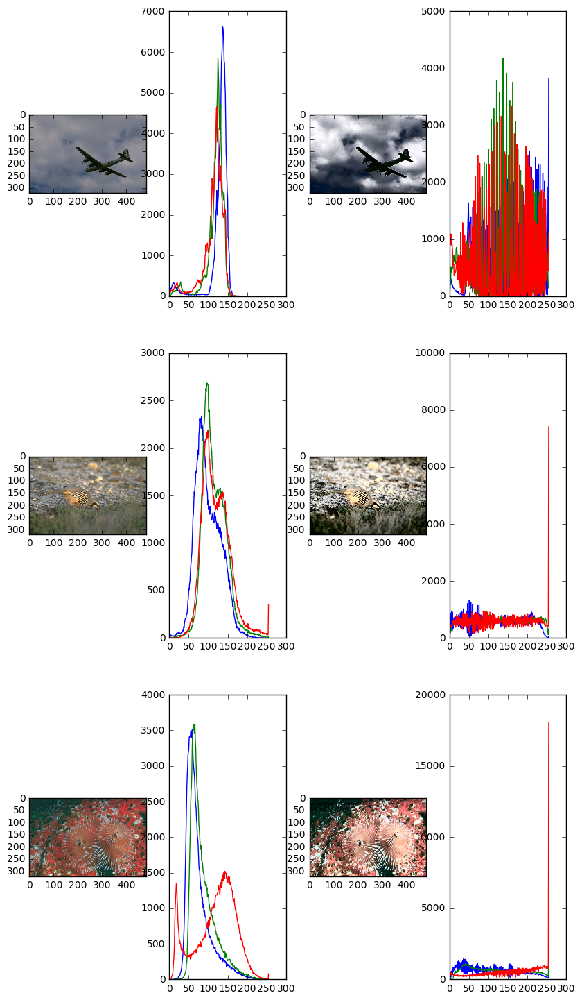

In [230]:
#Global Histogram Equalization

def global_hist_equalization(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    y,u,v = cv2.split(img)
    y = cv2.equalizeHist(y)
    img = cv2.merge([y,u,v])
    img = cv2.cvtColor(img, cv2.COLOR_YUV2BGR)
    return img

fig, plots = plt.subplots(3, 4,figsize=(10,18))
plots = plots.flatten()
images = ['3096.jpg', '8023.jpg', '12084.jpg']

for ind,image in enumerate(images):
    b,g,r = cv2.split(cv2.imread('img/' + image))
    rgbimg = cv2.merge((r,g,b))
    plots[4*ind].imshow(rgbimg)
    histr = plothistogram(cv2.imread('img/' + image), plots[ind * 4 + 1])
    equalizedImage = global_hist_equalization(cv2.imread('img/' + image))
    b,g,r = cv2.split(equalizedImage)
    rgbimg = cv2.merge((r,g,b))
    plots[4*ind + 2].imshow(rgbimg)
    plothistogram(equalizedImage, plots[ind * 4 + 3])
    
    


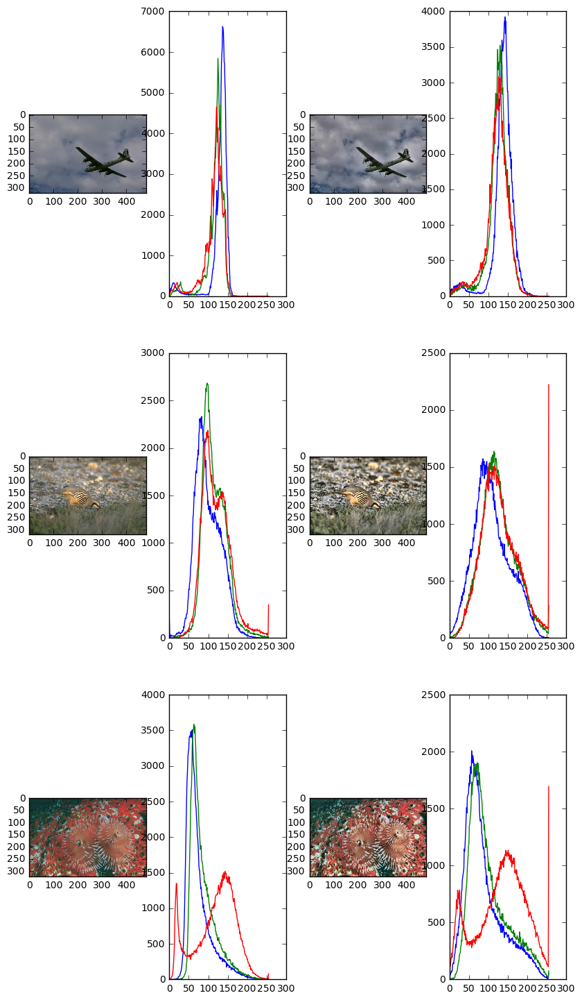

In [231]:
#Adaptive Histogram Equalization

clahe_obj = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
def clahe(img):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    y,u,v = cv2.split(img)
    y = clahe_obj.apply(y)
    img = cv2.merge([y,u,v])
    img = cv2.cvtColor(img, cv2.COLOR_YUV2RGB)
    return img

fig, plots = plt.subplots(3, 4,figsize=(10,18))
plots = plots.flatten()
images = ['3096.jpg', '8023.jpg', '12084.jpg']

for ind,image in enumerate(images):
    b,g,r = cv2.split(cv2.imread('img/' + image))
    rgbimg = cv2.merge((r,g,b))
    plots[4*ind].imshow(rgbimg)
    histr = plothistogram(cv2.imread('img/' + image), plots[ind * 4 + 1])
    equalizedImage = clahe(cv2.imread('img/' + image))
    b,g,r = cv2.split(equalizedImage)
    rgbimg = cv2.merge((r,g,b))
    plots[4*ind + 2].imshow(rgbimg)
    plothistogram(equalizedImage, plots[ind * 4 + 3])
    
    



In [158]:
import evaluate

3096.jpg 0.8500074481382892
8023.jpg 0.6758116851574796
12084.jpg 0.16946781432762742
14037.jpg 0.710656019067234
16077.jpg 0.31054203016819837
19021.jpg 0.3045835195367906
21077.jpg 0.5971852513908589
24077.jpg 0.3375366739852721
33039.jpg 0.0
37073.jpg 0.7478060375256637


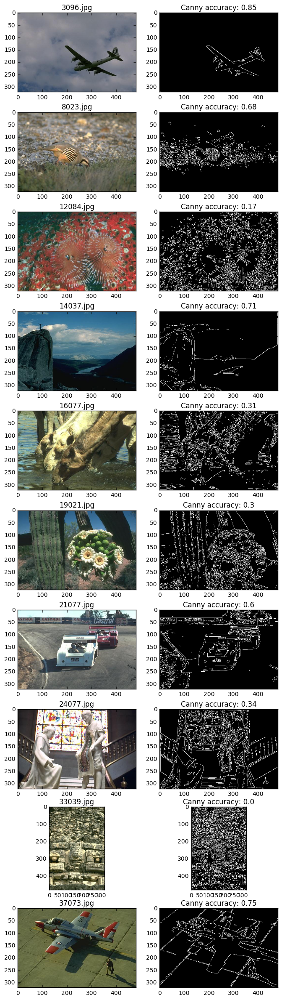

In [180]:
#Canny Edge Detector
fig, plots = plt.subplots(10, 2,figsize=(10,27))
plots= plots.flatten()
images = ['3096.jpg', '8023.jpg', '12084.jpg', '14037.jpg', '16077.jpg', '19021.jpg', '21077.jpg', '24077.jpg', '33039.jpg'
         , '37073.jpg']
mean = 0

for ind, image in enumerate(images):
    img = cv2.imread('img/' + image)
    b,g,r = cv2.split(img)
    rgbimg = cv2.merge((r,g,b))
    plots[2*ind].imshow(rgbimg)
    plots[2*ind].set_title(image)
    gt = "ground_truth/" + image.replace(".jpg",".bmp")
    edges = cv2.Canny(img,0.5*h,h)
    cv2.imwrite('temp.jpg', edges)
    im = cv2.imread('temp.jpg')
    accuracy = evaluate.evaluate('temp.jpg', gt)
    mean += accuracy
    acc = round(accuracy,2)
    print(image + " " + str(accuracy))
    plots[2*ind + 1].imshow(edges, cmap='Greys_r')
    plots[2*ind + 1].set_title("Canny accuracy: %s" % (acc))

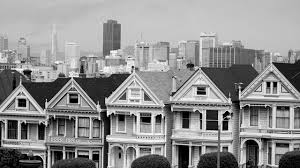

In [194]:
Image(filename = 'Img/sudoku.jpg')



3096.jpg 0.8431422076281889
8023.jpg 0.8277925661103231
12084.jpg 0.6625086625086625
14037.jpg 0.733790584257874
16077.jpg 0.7465754755474382
19021.jpg 0.721821749859133
21077.jpg 0.709891775312336
24077.jpg 0.521978484595307
33039.jpg 0.19477853122712935
37073.jpg 0.6455139539251689


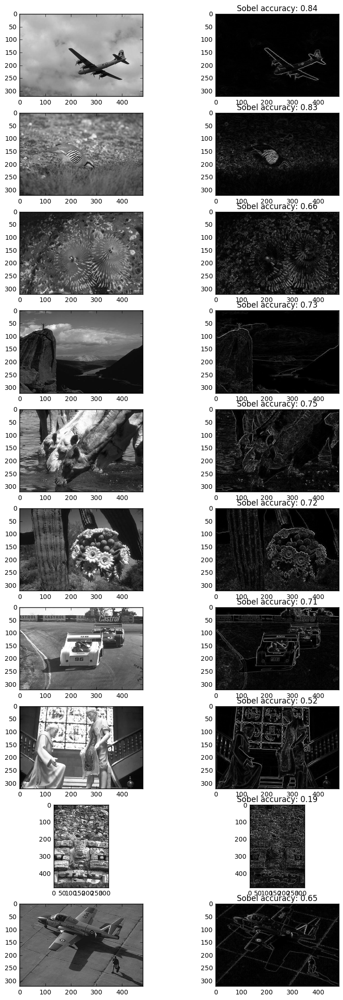

In [214]:
#Sobel Edge Detector
from scipy import ndimage
import numpy as np

fig, plots = plt.subplots(10, 2,figsize=(10,27))
plots= plots.flatten()
images = ['3096.jpg', '8023.jpg', '12084.jpg', '14037.jpg', '16077.jpg', '19021.jpg', '21077.jpg', '24077.jpg', '33039.jpg'
         , '37073.jpg']
for ind, image in enumerate(images): 
    img = cv2.imread('img/' + image,0)
    sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=1)
    sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=1)
    gt = "ground_truth/" + image.replace(".jpg",".bmp")
    sx2 = np.square(sobelx)
    sy2 = np.square(sobely)
    sNorm2 = np.sqrt(sx2+sy2)
    cv2.imwrite('temp.jpg', sNorm2)
    plots[2*ind].imshow(img, cmap = 'gray')
    plots[2*ind+1].imshow(sNorm2, cmap = 'gray')
    accuracy = evaluate.evaluate('temp.jpg', gt)
    mean += accuracy
    acc = round(accuracy,2)
    print(image + " " + str(accuracy))
    plots[2*ind + 1].set_title("Sobel accuracy: %s" % (acc))




